## Faezeh Yazdi Capstone Project - Food Recomendation System

## Notebook : Recipe Data cleaning
This notebook aims to clean the first dataset, investigate data and do EDA.



#### Dataset:
Data is downloaded from Kaggle which is originaly from Food.com website. 
There is two main Tables:
- Recepies <br>
The recipes dataset contains 522,517 recipes from 312 different categories. This dataset provides information about each recipe like cooking times, servings, ingredients, nutrition, instructions, and more.


#### Data Dictionary
For definition of each column and data dictionary please visit Capstone 2nd deliverable, data wireframe and sprint planning.


### Table of Content

- 1. [Data Cleaning](#Data_cleaning)

    1. [Duplicate data](#Duplicate_data)
    2. [Missing Data](#Missing_Data)
    3. [Datatypes and formats](#Datatypes_and_formats)
    4. [Summary of Cleaning](#Summary_of_Cleaning)
    
    
- 2. [Preliminary_data_exploration](#Preliminary_data_exploration)
    1. [Numeric_columns](#Numeric_columns)
        - [Calories_and_Nutrition_facts](#Calories_and_Nutrition_facts)
        - [Reviewcounts](#Reviewcounts)
        - [Times](#Reviewcounts)
    2. [Categorical_Columns](#Categorical_Columns)
        - [authors](#authors)
        - [Recipe_Category](#Recipe_Category)
        
        
- 3. [Relationships_Visualizations](#Relationships_Visualizations)

    

## Data Cleaning <a name = "Data_cleaning" a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
#use terminal to insatll --> pip install pyarrow

In [2]:
# load data with parquet format
df = pd.read_parquet('Raw Data/recipes.parquet',engine='pyarrow')


In [3]:
# Set the maximum number of columns to display to None
pd.set_option('display.max_columns', None)

The reason we used parquet file format while the csv was also available was that:
-  csv file could not understand the datepublished format.
-  csv file could no understand the Keywords correctly, and it returned null values for more the 17K rows.
the only problem with parquet file is that the text columns are known as ndarrays while csv look at them as str which is more desirable for us.

In [4]:
df.head(4)

,RecipeId,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeServings,RecipeYield,RecipeInstructions
0,38.0,Low-Fat Berry Blue Frozen Dessert,1533,Dancer,PT24H,PT45M,PT24H45M,1999-08-09 21:46:00+00:00,Make and share this Low-Fat Berry Blue Frozen ...,[https://img.sndimg.com/food/image/upload/w_55...,Frozen Desserts,"[Dessert, Low Protein, Low Cholesterol, Health...","[4, 1⁄4, 1, 1]","[blueberries, granulated sugar, vanilla yogurt...",4.5,4.0,170.9,2.5,1.3,8.0,29.8,37.1,3.6,30.2,3.2,4.0,None,"[Toss 2 cups berries with sugar., Let stand fo..."
1,39.0,Biryani,1567,elly9812,PT25M,PT4H,PT4H25M,1999-08-29 13:12:00+00:00,Make and share this Biryani recipe from Food.com.,[https://img.sndimg.com/food/image/upload/w_55...,Chicken Breast,"[Chicken Thigh & Leg, Chicken, Poultry, Meat, ...","[1, 4, 2, 2, 8, 1⁄4, 8, 1⁄2, 1, 1, 1⁄4, 1⁄4, 1...","[saffron, milk, hot green chili peppers, onion...",3.0,1.0,1110.7,58.8,16.6,372.8,368.4,84.4,9.0,20.4,63.4,6.0,None,[Soak saffron in warm milk for 5 minutes and p...
2,40.0,Best Lemonade,1566,Stephen Little,PT5M,PT30M,PT35M,1999-09-05 19:52:00+00:00,This is from one of my first Good House Keepi...,[https://img.sndimg.com/food/image/upload/w_55...,Beverages,"[Low Protein, Low Cholesterol, Healthy, Summer...","[1 1⁄2, 1, None, 1 1⁄2, None, 3⁄4]","[sugar, lemons, rind of, lemon, zest of, fresh...",4.5,10.0,311.1,0.2,0.0,0.0,1.8,81.5,0.4,77.2,0.3,4.0,None,"[Into a 1 quart Jar with tight fitting lid, pu..."
3,41.0,Carina's Tofu-Vegetable Kebabs,1586,Cyclopz,PT20M,PT24H,PT24H20M,1999-09-03 14:54:00+00:00,This dish is best prepared a day in advance to...,[https://img.sndimg.com/food/image/upload/w_55...,Soy/Tofu,"[Beans, Vegetable, Low Cholesterol, Weeknight,...","[12, 1, 2, 1, 10, 1, 3, 2, 2, 2, 1, 2, 1⁄2, 1⁄...","[extra firm tofu, eggplant, zucchini, mushroom...",4.5,2.0,536.1,24.0,3.8,0.0,1558.6,64.2,17.3,32.1,29.3,2.0,4 kebabs,"[Drain the tofu, carefully squeezing out exces..."


In [5]:
#how much data we are working with here?
df.shape
print(f'the repecie table has {df.shape[0]} rows and {df.shape[1]} columns')

the repecie table has 522517 rows and 28 columns


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522517 entries, 0 to 522516
Data columns (total 28 columns):
 #   Column                      Non-Null Count   Dtype              
---  ------                      --------------   -----              
 0   RecipeId                    522517 non-null  float64            
 1   Name                        522517 non-null  object             
 2   AuthorId                    522517 non-null  int32              
 3   AuthorName                  522517 non-null  object             
 4   CookTime                    439972 non-null  object             
 5   PrepTime                    522517 non-null  object             
 6   TotalTime                   522517 non-null  object             
 7   DatePublished               522517 non-null  datetime64[ns, UTC]
 8   Description                 522512 non-null  object             
 9   Images                      522516 non-null  object             
 10  RecipeCategory              521766 non-null 

In [7]:
# all the columns
df.columns

Index(['RecipeId', 'Name', 'AuthorId', 'AuthorName', 'CookTime', 'PrepTime',
       'TotalTime', 'DatePublished', 'Description', 'Images', 'RecipeCategory',
       'Keywords', 'RecipeIngredientQuantities', 'RecipeIngredientParts',
       'AggregatedRating', 'ReviewCount', 'Calories', 'FatContent',
       'SaturatedFatContent', 'CholesterolContent', 'SodiumContent',
       'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent',
       'RecipeServings', 'RecipeYield', 'RecipeInstructions'],
      dtype='object')

Although we have RecipeId that seems to be unique, I prefer to keep the index column for now.
Next steps:
- Check for duplicate data (is the data unique on the row-level? What is the row-level?)
- Check for missing data
- Check datatypes and formats

---
### Duplicate data <a name='Duplicate_data' a>

In [8]:
#finding duplicates


'''
    Note for the reason behind following lines of code:
    using dataframe from parquite format, df.duplicated().sum() will return error that some columns are ndarrays 
    and they are nor hashable.
    so we have to find the unhashable columns and transfer them to a hashable format like tuple which is hashable.
    Referecing Note: For tackling this problem, ChatGBT is used.
'''   


'\n    Note for the reason behind following lines of code:\n    using dataframe from parquite format, df.duplicated().sum() will return error that some columns are ndarrays \n    and they are nor hashable.\n    so we have to find the unhashable columns and transfer them to a hashable format like tuple which is hashable.\n    Referecing Note: For tackling this problem, ChatGBT is used.\n'

In [9]:
# find unhashable columns
print(df.applymap(type))

               RecipeId           Name       AuthorId     AuthorName  \
0       <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   
1       <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   
2       <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   
3       <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   
4       <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   
...                 ...            ...            ...            ...   
522512  <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   
522513  <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   
522514  <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   
522515  <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   
522516  <class 'float'>  <class 'str'>  <class 'int'>  <class 'str'>   

                  CookTime       PrepTime      TotalTime  \
0            <class 'str'>  <class 'str'>  <class 'str'>   
1            <c

Keywords, Images,RecipeInstructions,RecipeIngredientQuantities,RecipeIngredientParts are ndarrays and need to change the datatype.

In [10]:
#converting columns that are cuasing problem to hashable data types

df['RecipeInstructions'] = df['RecipeInstructions'].apply(lambda x: tuple(x))

df['RecipeIngredientQuantities'] = df['RecipeIngredientQuantities'].apply(lambda x: tuple(x))

df["RecipeIngredientParts"] = df["RecipeIngredientParts"].apply(lambda x: tuple(x))

df["Keywords"] = df["Keywords"].apply(lambda x: tuple(x))

Image column is nontype and can not be changed to tuples. in addidtion for checking duplicated rows it makes no difference. so we can check the duplicates without this column.

In [11]:
#make temporary dataset for checking duplicates
df_CkeckDuplicat = df.drop(columns=["Images"])


In [12]:
#show all duplicate rows
df_CkeckDuplicat[df_CkeckDuplicat.duplicated(keep=False)]

,RecipeId,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeServings,RecipeYield,RecipeInstructions


There is no duplicated rows. It maybe becuase they have different RecipieId. lets check.

In [13]:
#set index as RecipeId
df_CkeckDuplicat=df_CkeckDuplicat.set_index("RecipeId")


In [14]:
#number of duplicated
df_CkeckDuplicat.duplicated().sum()

84

In [15]:
#show all duplicate rows
df_CkeckDuplicat[df_CkeckDuplicat.duplicated(keep=False)]

,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeServings,RecipeYield,RecipeInstructions
RecipeId,,,,,,,,,,,,,,,,,,,,,,,,,,
134437.0,Copycat Wendy&rsquo;s Spicy Chicken Fillet San...,2001112113,Jonathan Melendez,PT20M,PT30M,PT50M,2019-02-22 18:59:00+00:00,Make and share this Copycat Wendy&rsquo;s Spic...,Lunch/Snacks,"(Chicken, Poultry, Meat, < 60 Mins)","(4, 1⁄2, 1, 4, 1 1⁄2, 1, 1, 1, 1, 1, 4 -6, 4, ...","(chicken breasts, buttermilk, all-purpose flou...",4.0,3.0,2412.4,235.5,22.2,102.9,784.8,41.9,2.4,3.9,38.0,4.0,None,"(In a large bowl, combine the chicken, jalapeñ..."
180738.0,Greek-Style Chicken Casserole,93446,Irmgard,PT1H,PT10M,PT1H10M,2006-08-07 21:12:00+00:00,This makes a wonderful meal served with a gree...,Chicken Thigh & Leg,"(Chicken, Poultry, Vegetable, Meat, Greek, Eur...","(4, 2, 2, 1, 1, 1, 1⁄4, 1⁄4, 1⁄4, 1⁄4, 1, 1, 1...","(chicken legs, olive oil, garlic cloves, onion...",5.0,2.0,701.0,41.4,15.5,189.3,1302.6,35.2,4.5,10.5,44.4,4.0,None,(Separate the chicken legs at the joints; wipe...
180739.0,Greek-Style Chicken Casserole,93446,Irmgard,PT1H,PT10M,PT1H10M,2006-08-07 21:12:00+00:00,This makes a wonderful meal served with a gree...,Chicken Thigh & Leg,"(Chicken, Poultry, Vegetable, Meat, Greek, Eur...","(4, 2, 2, 1, 1, 1, 1⁄4, 1⁄4, 1⁄4, 1⁄4, 1, 1, 1...","(chicken legs, olive oil, garlic cloves, onion...",5.0,2.0,701.0,41.4,15.5,189.3,1302.6,35.2,4.5,10.5,44.4,4.0,None,(Separate the chicken legs at the joints; wipe...
221240.0,Copycat Red Lobster Nantucket Baked Cod,2001112113,Jonathan Melendez,PT11M,PT5M,PT16M,2019-02-22 18:53:00+00:00,Make and share this Copycat Red Lobster Nantuc...,Very Low Carbs,"(< 30 Mins,)","(4, 4, 2, 1⁄2, 1⁄2, 1⁄4, 1⁄8, 8, 3, 2)","(olive oil, cod fish fillets, lemon juice, sal...",NaN,1.0,372.9,16.7,2.9,102.6,486.6,10.7,3.2,6.7,44.9,4.0,None,"(Preheat oven to 425 degrees F., Drizzle 2 tab..."
221841.0,Beef Stew,319796,Jane Gib,None,PT3H,PT3H,2007-04-10 16:53:00+00:00,Make and share this Beef Stew recipe from Food...,< 4 Hours,"(Easy,)","(26, 3, 2, 2, 1, 2, 1⁄4, 3)","(beef, potatoes, onions, celery, bay leaf, sal...",NaN,NaN,1855.1,174.5,72.5,243.2,4759.1,45.2,6.5,5.3,25.5,3.0,None,(Place all ingredients in a baking dish or cas...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
540638.0,Greek Meatball Kabobs,1436160,GibbyLou,PT15M,PT35M,PT50M,2020-07-03 21:27:00+00:00,Make and share this Greek Meatball Kabobs reci...,Vegetable,"(Meat, Southwest Asia (middle East), < 60 Mins)","(1, 1⁄4, 1, 2, 1⁄2, 1, 1, 1, 2, 1⁄2, 1⁄2, 1⁄4)","(ground beef, feta cheese, green onions, red b...",NaN,NaN,349.3,25.7,8.8,83.8,311.1,5.6,1.8,3.6,23.4,4.0,4 kabobs,(Spray broiler pan rack with nonstick cooking ...
540653.0,Moo Shu Pork Tortillas,2001004241,CLUBFOODY,PT10M,PT15M,PT25M,2020-07-07 15:31:00+00:00,"Very colorful and inviting, this recipe is pac...",< 30 Mins,"(Easy, Inexpensive, From Scratch)","(1⁄2, 1, 1⁄2, 1⁄2, 1, 3, 2, 2, 1, 2, 1 1⁄2, 2,...","(canola oil, ground pork, red onion, ginger, g...",NaN,NaN,331.3,16.8,5.4,41.0,565.3,30.7,2.5,5.9,14.1,NaN,8 tortillas,"(In a large skillet over medium heat, add oil ..."
540654.0,Moo Shu Pork Tortillas,2001004241,CLUBFOODY,PT10M,PT15M,PT25M,2020-07-07 15:31:00+00:00,"Very colorful and inviting, this recipe is pac...",< 30 Mins,"(Easy, Inexpensive, From Scratch)","(1⁄2, 1, 1⁄2, 1⁄2, 1, 3, 2, 2, 1, 2, 1 1⁄2, 2,...","(canola oil, ground pork, red onion, ginger, g...",NaN,NaN,331.3,16.8,5.4,41.0,565.3,30.7,2.5,5.9,14.1,NaN,8 tortillas,"(In a large skillet over medium heat, add oil ..."


it seems they are some typo in dedicatingg recipeids to recipes and we have two recipe id for tha same information. so we will drop these rows from our original dataset(which includes images).

In [16]:
#set the index to RecipeId to be able to drop base on 
df = df.set_index('RecipeId')

In [17]:
# drop the rows with indexes of duplicated rows
df = df.drop(df_CkeckDuplicat[df_CkeckDuplicat.duplicated()].index)

In [18]:
#sanity check
df.shape

(522433, 27)

---

### Missing Data <a name='Missing_Data' a>

In [19]:
#number of missing values
df.isna().sum()

Name                               0
AuthorId                           0
AuthorName                         0
CookTime                       82532
PrepTime                           0
TotalTime                          0
DatePublished                      0
Description                        5
Images                             1
RecipeCategory                   749
Keywords                           0
RecipeIngredientQuantities         0
RecipeIngredientParts              0
AggregatedRating              253143
ReviewCount                   247410
Calories                           0
FatContent                         0
SaturatedFatContent                0
CholesterolContent                 0
SodiumContent                      0
CarbohydrateContent                0
FiberContent                       0
SugarContent                       0
ProteinContent                     0
RecipeServings                182888
RecipeYield                   348024
RecipeInstructions                 0
d

In [20]:
# ratio of missing values to total number of values
df.isna().sum()/df.shape[0] *100

Name                           0.000000
AuthorId                       0.000000
AuthorName                     0.000000
CookTime                      15.797624
PrepTime                       0.000000
TotalTime                      0.000000
DatePublished                  0.000000
Description                    0.000957
Images                         0.000191
RecipeCategory                 0.143368
Keywords                       0.000000
RecipeIngredientQuantities     0.000000
RecipeIngredientParts          0.000000
AggregatedRating              48.454634
ReviewCount                   47.357269
Calories                       0.000000
FatContent                     0.000000
SaturatedFatContent            0.000000
CholesterolContent             0.000000
SodiumContent                  0.000000
CarbohydrateContent            0.000000
FiberContent                   0.000000
SugarContent                   0.000000
ProteinContent                 0.000000
RecipeServings                35.006977


In [21]:
# chcking if Null values for AggregatedRating  and ReviewCount are the same rows or not
df = df.reset_index()
df[df['AggregatedRating'].isna()|df['ReviewCount'].isna()]["RecipeId"].count()/df.shape[0] *100

48.454634374168556

48% of rows are null in `AggregatedRating` or `ReviewCount`. These columns are the most informative variable for us, so we cannot drop the column or fill them with mean or mode. Due to huge number of sample set, the best way to deal with these nulls is to drop the rows.

In [22]:
#for compare with sanity check
print(f' Number of rows before droping {df.shape}')
# drop rows with null values in AggregatedRating
df = df.drop(index = df[df['AggregatedRating'].isna()].index)
#sanity check
print(f' Number of rows after droping AggregatedRating nulls {df.shape}')

# drop rows with null values in ReviewCount
df = df.drop(index = df[df['ReviewCount'].isna()].index)
#sanity check
print(f' Number of rows after droping ReviewCount nulls {df.shape}')


 Number of rows before droping (522433, 28)
 Number of rows after droping AggregatedRating nulls (269290, 28)
 Number of rows after droping ReviewCount nulls (269290, 28)


After droping these rows, lets check if other columns null values are also has decreased or not.

In [23]:
df.isna().sum()/df.shape[0] *100

RecipeId                       0.000000
Name                           0.000000
AuthorId                       0.000000
AuthorName                     0.000000
CookTime                      15.887705
PrepTime                       0.000000
TotalTime                      0.000000
DatePublished                  0.000000
Description                    0.001114
Images                         0.000371
RecipeCategory                 0.090980
Keywords                       0.000000
RecipeIngredientQuantities     0.000000
RecipeIngredientParts          0.000000
AggregatedRating               0.000000
ReviewCount                    0.000000
Calories                       0.000000
FatContent                     0.000000
SaturatedFatContent            0.000000
CholesterolContent             0.000000
SodiumContent                  0.000000
CarbohydrateContent            0.000000
FiberContent                   0.000000
SugarContent                   0.000000
ProteinContent                 0.000000


Still 66% of `RecipeYield` and 36% of `RecipeServings` columns are null. As these are not important factors in people preference and therefore our model. Moreover callories and other nutrition factors are amounts per serving,therefore they are not dependent on number of RecipeServings.Thus, we can drop the **columns**. 

In [24]:
# drop RecipeYield and RecipeServings columns
df = df.drop(columns = ["RecipeYield","RecipeServings"])

#sanity check
df.shape

(269290, 26)

Also `Description` column is one of the critical columns to save and have not null value. so lets drop the rows with null value in this column.

In [25]:
# drop rows with null values in Description
df = df.drop(index = df[df['Description'].isna()].index)

#sanity check
df.shape


(269287, 26)

Moreover we have to deal with `RecipeCategory` and `RecipeIngredientQuantities`. As they are not too many rows, dropping is the better way rather than manually search and fill them one by one.

In [26]:
# drop rows with null values in RecipeCategory
df = df.drop(index = df[df['RecipeCategory'].isna()].index)

#sanity check
print(f'shape ofter dropping RecipeCategory {df.shape}')

# drop rows with null values in RecipeIngredientQuantities
df = df.drop(index = df[df['RecipeIngredientQuantities'].isna()].index)

#sanity check
print(f'shape ofter dropping RecipeIngredientQuantities {df.shape}')

shape ofter dropping RecipeCategory (269042, 26)
shape ofter dropping RecipeIngredientQuantities (269042, 26)


The reason that we do not drop all null values in columns together is that we want to make sure how many new rows are dropped in each step. It can not be understood from null percentage, because there might be a row with multiple null columns.

In [27]:
# recheck the missing values
df.isna().sum()/df.shape[0] *100

RecipeId                       0.000000
Name                           0.000000
AuthorId                       0.000000
AuthorName                     0.000000
CookTime                      15.898633
PrepTime                       0.000000
TotalTime                      0.000000
DatePublished                  0.000000
Description                    0.000000
Images                         0.000000
RecipeCategory                 0.000000
Keywords                       0.000000
RecipeIngredientQuantities     0.000000
RecipeIngredientParts          0.000000
AggregatedRating               0.000000
ReviewCount                    0.000000
Calories                       0.000000
FatContent                     0.000000
SaturatedFatContent            0.000000
CholesterolContent             0.000000
SodiumContent                  0.000000
CarbohydrateContent            0.000000
FiberContent                   0.000000
SugarContent                   0.000000
ProteinContent                 0.000000


The only column with missing value that is left is `CookTime`. however Cooktime should be the difference between `Totaltime` and `PrepTime`. After correcting its format, we can check this assumption and if its true, filling its null value by calculating them.

### Datatypes and formats <a name = 'Datatypes_and_formats' a>

In this part we want to make sure all columns are in the right format.

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 269042 entries, 0 to 522347
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype              
---  ------                      --------------   -----              
 0   RecipeId                    269042 non-null  float64            
 1   Name                        269042 non-null  object             
 2   AuthorId                    269042 non-null  int32              
 3   AuthorName                  269042 non-null  object             
 4   CookTime                    226268 non-null  object             
 5   PrepTime                    269042 non-null  object             
 6   TotalTime                   269042 non-null  object             
 7   DatePublished               269042 non-null  datetime64[ns, UTC]
 8   Description                 269042 non-null  object             
 9   Images                      269042 non-null  object             
 10  RecipeCategory              269042 non-null 

`RecipeId` type

In [29]:
# check if we can change resipeid to int
sum((df['RecipeId']/df['RecipeId'].astype(int))>1)

0

There is no recipeid which is not integer. so lets change the type.

In [30]:
# recipeId to int
df['RecipeId'] = df['RecipeId'].astype(int)

`TotalTime`,`PrepTime`,`CookTime` Type

This column format should change to a consistant numerical type for using in models, however the current format for these columns is object and its simillar to ISO860 duration format. We will fix any inconsistant rows and then will transfer them to duration type using isodate package.<br> 
Referencing Note: Obviously, many google research has done to figure out the solution.

In [31]:
#import package for parsing ISO860 duration
import isodate

#defining function to parse, or if had any error empty
def parse_duration_or_return_na(x):
    try:
        return isodate.parse_duration(x)
    except isodate.ISO8601Error:
        return pd.NaT

In [32]:
#PrepTime
#parsing PrepTime with above function
df['PrepTimeClean'] = df['PrepTime'].apply(parse_duration_or_return_na)

#checking the rows that had problem in parsing
invalid_rows = df[df['PrepTimeClean'].isna()]
invalid_rows['PrepTime']

#correcting their format
df['PrepTime'] = df['PrepTime'].str.replace('-','')

#apply the function again
df['PrepTimeClean'] = df['PrepTime'].apply(parse_duration_or_return_na)
#sanity check
df[df['PrepTimeClean'].isna()]

,RecipeId,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeInstructions,PrepTimeClean


In [33]:
#TotalTime
#parsing TotalTime with above function
df['TotalTimeClean'] = df['TotalTime'].apply(parse_duration_or_return_na)

#checking if any row had problem during function
display(df[df['TotalTimeClean'].isna()])

#correcting their format
df['TotalTime'] = df['TotalTime'].str.replace('-','')

#apply the function again
df['TotalTimeClean'] = df['TotalTime'].apply(parse_duration_or_return_na)
#sanity check
df[df['TotalTimeClean'].isna()]

,RecipeId,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeInstructions,PrepTimeClean,TotalTimeClean
225765,235258,Lemon Squares,518808,jgronska82,None,PT1M,PT-2M,2007-06-16 11:08:00+00:00,Make and share this Lemon Squares recipe from ...,[],Dessert,"(< 15 Mins,)","(1, 1⁄4, 1⁄2, 1, 1⁄2, 2, 2, 2)","(flour, confectioners' sugar, butter, sugar, b...",5.0,1.0,2317.2,103.3,61.6,667.0,978.6,329.9,3.9,231.3,26.6,"(Preheat oven 350°F., Sift flour and confectio...",0 days 00:01:00,NaT


,RecipeId,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeInstructions,PrepTimeClean,TotalTimeClean


In [34]:
#cook time
#with above function just paring CookTimes that are not null
df['CookTimeClean'] = df[~(df['CookTime'].isna())]['CookTime'].apply(parse_duration_or_return_na)

#sanity check
df[~(df['CookTime'].isna())].head()

,RecipeId,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeInstructions,PrepTimeClean,TotalTimeClean,CookTimeClean
0,38,Low-Fat Berry Blue Frozen Dessert,1533,Dancer,PT24H,PT45M,PT24H45M,1999-08-09 21:46:00+00:00,Make and share this Low-Fat Berry Blue Frozen ...,[https://img.sndimg.com/food/image/upload/w_55...,Frozen Desserts,"(Dessert, Low Protein, Low Cholesterol, Health...","(4, 1⁄4, 1, 1)","(blueberries, granulated sugar, vanilla yogurt...",4.5,4.0,170.9,2.5,1.3,8.0,29.8,37.1,3.6,30.2,3.2,"(Toss 2 cups berries with sugar., Let stand fo...",0 days 00:45:00,1 days 00:45:00,1 days 00:00:00
1,39,Biryani,1567,elly9812,PT25M,PT4H,PT4H25M,1999-08-29 13:12:00+00:00,Make and share this Biryani recipe from Food.com.,[https://img.sndimg.com/food/image/upload/w_55...,Chicken Breast,"(Chicken Thigh & Leg, Chicken, Poultry, Meat, ...","(1, 4, 2, 2, 8, 1⁄4, 8, 1⁄2, 1, 1, 1⁄4, 1⁄4, 1...","(saffron, milk, hot green chili peppers, onion...",3.0,1.0,1110.7,58.8,16.6,372.8,368.4,84.4,9.0,20.4,63.4,(Soak saffron in warm milk for 5 minutes and p...,0 days 04:00:00,0 days 04:25:00,0 days 00:25:00
2,40,Best Lemonade,1566,Stephen Little,PT5M,PT30M,PT35M,1999-09-05 19:52:00+00:00,This is from one of my first Good House Keepi...,[https://img.sndimg.com/food/image/upload/w_55...,Beverages,"(Low Protein, Low Cholesterol, Healthy, Summer...","(1 1⁄2, 1, None, 1 1⁄2, None, 3⁄4)","(sugar, lemons, rind of, lemon, zest of, fresh...",4.5,10.0,311.1,0.2,0.0,0.0,1.8,81.5,0.4,77.2,0.3,"(Into a 1 quart Jar with tight fitting lid, pu...",0 days 00:30:00,0 days 00:35:00,0 days 00:05:00
3,41,Carina's Tofu-Vegetable Kebabs,1586,Cyclopz,PT20M,PT24H,PT24H20M,1999-09-03 14:54:00+00:00,This dish is best prepared a day in advance to...,[https://img.sndimg.com/food/image/upload/w_55...,Soy/Tofu,"(Beans, Vegetable, Low Cholesterol, Weeknight,...","(12, 1, 2, 1, 10, 1, 3, 2, 2, 2, 1, 2, 1⁄2, 1⁄...","(extra firm tofu, eggplant, zucchini, mushroom...",4.5,2.0,536.1,24.0,3.8,0.0,1558.6,64.2,17.3,32.1,29.3,"(Drain the tofu, carefully squeezing out exces...",1 days 00:00:00,1 days 00:20:00,0 days 00:20:00
4,42,Cabbage Soup,1538,Duckie067,PT30M,PT20M,PT50M,1999-09-19 06:19:00+00:00,Make and share this Cabbage Soup recipe from F...,[https://img.sndimg.com/food/image/upload/w_55...,Vegetable,"(Low Protein, Vegan, Low Cholesterol, Healthy,...","(46, 4, 1, 2, 1)","(plain tomato juice, cabbage, onion, carrots, ...",4.5,11.0,103.6,0.4,0.1,0.0,959.3,25.1,4.8,17.7,4.3,"(Mix everything together and bring to a boil.,...",0 days 00:20:00,0 days 00:50:00,0 days 00:30:00


Total value should be the sum of cook time and prepration time. lets check if any wrong value inserted.

In [35]:
#total less than prepration
df[df["TotalTimeClean"]<df["PrepTimeClean"]]["RecipeId"].count()

4

In [36]:
df[df["TotalTimeClean"] < df["PrepTimeClean"]].index

Int64Index([1517, 4261, 38158, 73447], dtype='int64')

In [37]:
#sanity chack before droping
print('before: ',df.shape)

#drop these wrong values
df = df.drop( index = df[df["TotalTimeClean"] < df["PrepTimeClean"]].index)

#sanity check
print('after: ',df.shape)

before:  (269042, 29)
after:  (269038, 29)


In [38]:
#fill the null values for CookTimeClean by substracting preptime from total time

df["CookTimeClean"] = np.where(df["CookTimeClean"].isna(),df['TotalTimeClean']-df["PrepTimeClean"],df["CookTimeClean"])

#sanity check
df[(df['CookTimeClean'].isna())].head()


,RecipeId,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeInstructions,PrepTimeClean,TotalTimeClean,CookTimeClean


There are some recepies that have no need to be cooked, so the cook time were null. as models can not work with null values, we have fill them by substracting preptime from total time which is zero.

Now we can drop the original time columns.

In [39]:
#droping original time columns
df.drop(columns=["CookTime","PrepTime","TotalTime"], inplace=True )

In [40]:
#Finaly check for any null values
df.isna().sum()

RecipeId                      0
Name                          0
AuthorId                      0
AuthorName                    0
DatePublished                 0
Description                   0
Images                        0
RecipeCategory                0
Keywords                      0
RecipeIngredientQuantities    0
RecipeIngredientParts         0
AggregatedRating              0
ReviewCount                   0
Calories                      0
FatContent                    0
SaturatedFatContent           0
CholesterolContent            0
SodiumContent                 0
CarbohydrateContent           0
FiberContent                  0
SugarContent                  0
ProteinContent                0
RecipeInstructions            0
PrepTimeClean                 0
TotalTimeClean                0
CookTimeClean                 0
dtype: int64

In [41]:
#Final check that all formats are right.
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 269038 entries, 0 to 522347
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype              
---  ------                      --------------   -----              
 0   RecipeId                    269038 non-null  int64              
 1   Name                        269038 non-null  object             
 2   AuthorId                    269038 non-null  int32              
 3   AuthorName                  269038 non-null  object             
 4   DatePublished               269038 non-null  datetime64[ns, UTC]
 5   Description                 269038 non-null  object             
 6   Images                      269038 non-null  object             
 7   RecipeCategory              269038 non-null  object             
 8   Keywords                    269038 non-null  object             
 9   RecipeIngredientQuantities  269038 non-null  object             
 10  RecipeIngredientParts       269038 non-null 

The `PrepTimeClean`, `TotalTimeClean`, `CookTimeClean` formats are all timedelta64 which is a little bit hard to work with. So we prefer them to be all in integers. lets make the all in hours.

In [42]:
#turning preptime to hours
df[['PrepTimeHours','CookingTimeHours','TotalTimeHours']] = df[['PrepTimeClean','CookTimeClean','TotalTimeClean']] / pd.Timedelta(hours=1)

#drop
df = df.drop(columns = ['PrepTimeClean','CookTimeClean','TotalTimeClean'])

In [43]:
df.head()

,RecipeId,Name,AuthorId,AuthorName,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeInstructions,PrepTimeHours,CookingTimeHours,TotalTimeHours
0,38,Low-Fat Berry Blue Frozen Dessert,1533,Dancer,1999-08-09 21:46:00+00:00,Make and share this Low-Fat Berry Blue Frozen ...,[https://img.sndimg.com/food/image/upload/w_55...,Frozen Desserts,"(Dessert, Low Protein, Low Cholesterol, Health...","(4, 1⁄4, 1, 1)","(blueberries, granulated sugar, vanilla yogurt...",4.5,4.0,170.9,2.5,1.3,8.0,29.8,37.1,3.6,30.2,3.2,"(Toss 2 cups berries with sugar., Let stand fo...",0.750000,24.000000,24.750000
1,39,Biryani,1567,elly9812,1999-08-29 13:12:00+00:00,Make and share this Biryani recipe from Food.com.,[https://img.sndimg.com/food/image/upload/w_55...,Chicken Breast,"(Chicken Thigh & Leg, Chicken, Poultry, Meat, ...","(1, 4, 2, 2, 8, 1⁄4, 8, 1⁄2, 1, 1, 1⁄4, 1⁄4, 1...","(saffron, milk, hot green chili peppers, onion...",3.0,1.0,1110.7,58.8,16.6,372.8,368.4,84.4,9.0,20.4,63.4,(Soak saffron in warm milk for 5 minutes and p...,4.000000,0.416667,4.416667
2,40,Best Lemonade,1566,Stephen Little,1999-09-05 19:52:00+00:00,This is from one of my first Good House Keepi...,[https://img.sndimg.com/food/image/upload/w_55...,Beverages,"(Low Protein, Low Cholesterol, Healthy, Summer...","(1 1⁄2, 1, None, 1 1⁄2, None, 3⁄4)","(sugar, lemons, rind of, lemon, zest of, fresh...",4.5,10.0,311.1,0.2,0.0,0.0,1.8,81.5,0.4,77.2,0.3,"(Into a 1 quart Jar with tight fitting lid, pu...",0.500000,0.083333,0.583333
3,41,Carina's Tofu-Vegetable Kebabs,1586,Cyclopz,1999-09-03 14:54:00+00:00,This dish is best prepared a day in advance to...,[https://img.sndimg.com/food/image/upload/w_55...,Soy/Tofu,"(Beans, Vegetable, Low Cholesterol, Weeknight,...","(12, 1, 2, 1, 10, 1, 3, 2, 2, 2, 1, 2, 1⁄2, 1⁄...","(extra firm tofu, eggplant, zucchini, mushroom...",4.5,2.0,536.1,24.0,3.8,0.0,1558.6,64.2,17.3,32.1,29.3,"(Drain the tofu, carefully squeezing out exces...",24.000000,0.333333,24.333333
4,42,Cabbage Soup,1538,Duckie067,1999-09-19 06:19:00+00:00,Make and share this Cabbage Soup recipe from F...,[https://img.sndimg.com/food/image/upload/w_55...,Vegetable,"(Low Protein, Vegan, Low Cholesterol, Healthy,...","(46, 4, 1, 2, 1)","(plain tomato juice, cabbage, onion, carrots, ...",4.5,11.0,103.6,0.4,0.1,0.0,959.3,25.1,4.8,17.7,4.3,"(Mix everything together and bring to a boil.,...",0.333333,0.500000,0.833333


In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 269038 entries, 0 to 522347
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype              
---  ------                      --------------   -----              
 0   RecipeId                    269038 non-null  int64              
 1   Name                        269038 non-null  object             
 2   AuthorId                    269038 non-null  int32              
 3   AuthorName                  269038 non-null  object             
 4   DatePublished               269038 non-null  datetime64[ns, UTC]
 5   Description                 269038 non-null  object             
 6   Images                      269038 non-null  object             
 7   RecipeCategory              269038 non-null  object             
 8   Keywords                    269038 non-null  object             
 9   RecipeIngredientQuantities  269038 non-null  object             
 10  RecipeIngredientParts       269038 non-null 

### Summary of Cleaning <a name = 'Summary_of_Cleaning' a>

- RecepieId there is Unique and has set for index.

**duplicates:**
- there is 84 rows with the exact same information but with difference recipeId, without considering image column. 
  --> they are dropped.
  
**missing values:**
- dropped rows:
    - About 50% of data are null in `Rating` or `reviews`. --> this the target variable, so can not fill in by estimation. so the rows are dropped.
    - rows with null values in Description,RecipeCategory,RecipeIngredientQuantities are also dropped.
- droped columns:
    - 66% `RecipeYield` is missing, and it is not important feature for this project, so its column is omitted.
    - `RecipeServings` has also many missing values. the assumption here is that RecipeServings would not affect     costumers preferance, so it is not needed for answering this project business question. Thus, this column is omitted.
- filled nulls:
    - The `cook time` can be filled in by calculating the difference between total time and preptime. Null cooktime referes to recipes that dont need to be cooked.
   
**Datatypes:**
- `recipeid` to int.
- `Cooktime`, `Preptime`, `Totaltime` to duration(timedelta64[ns]) using isodate library.




# Preliminary data exploration <a name = 'Preliminary_data_exploration' a>

### Numeric columns <a name = 'Numeric_columns' a>

Lets check some statistical indexes to understand the numeric column distributions.

In [45]:
df.describe()

,RecipeId,AuthorId,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,PrepTimeHours,CookingTimeHours,TotalTimeHours
count,269038.000000,2.690380e+05,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000,269038.000000
mean,217157.097031,6.383012e+06,4.632110,5.318516,475.005979,23.985219,9.342147,84.826882,763.122355,48.114304,3.731747,21.228399,17.464201,0.703967,2.080382,2.784112
std,141585.067767,1.077069e+08,0.641871,20.597388,1044.898937,79.186068,34.319520,239.335143,3870.357244,98.803391,8.622141,67.857896,45.563519,23.542165,366.389600,369.090157
min,38.000000,2.700000e+01,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,93835.750000,5.467800e+04,4.500000,1.000000,173.200000,5.600000,1.400000,4.100000,128.400000,12.700000,0.800000,2.400000,3.500000,0.166667,0.166667,0.333333
50%,201187.000000,1.698680e+05,5.000000,2.000000,312.500000,13.500000,4.600000,42.100000,361.700000,27.800000,2.100000,6.200000,9.200000,0.250000,0.333333,0.666667
75%,327842.000000,3.922300e+05,5.000000,4.000000,519.000000,26.800000,10.600000,106.200000,799.600000,50.000000,4.400000,17.200000,25.400000,0.333333,0.750000,1.083333
max,541298.000000,2.002849e+09,5.000000,3063.000000,350473.100000,30123.700000,13269.400000,83404.500000,731056.400000,9023.800000,3012.000000,7565.200000,18396.200000,8760.000000,189312.000000,189912.000000


To have an over view of all of our distribution lets make some subplots.

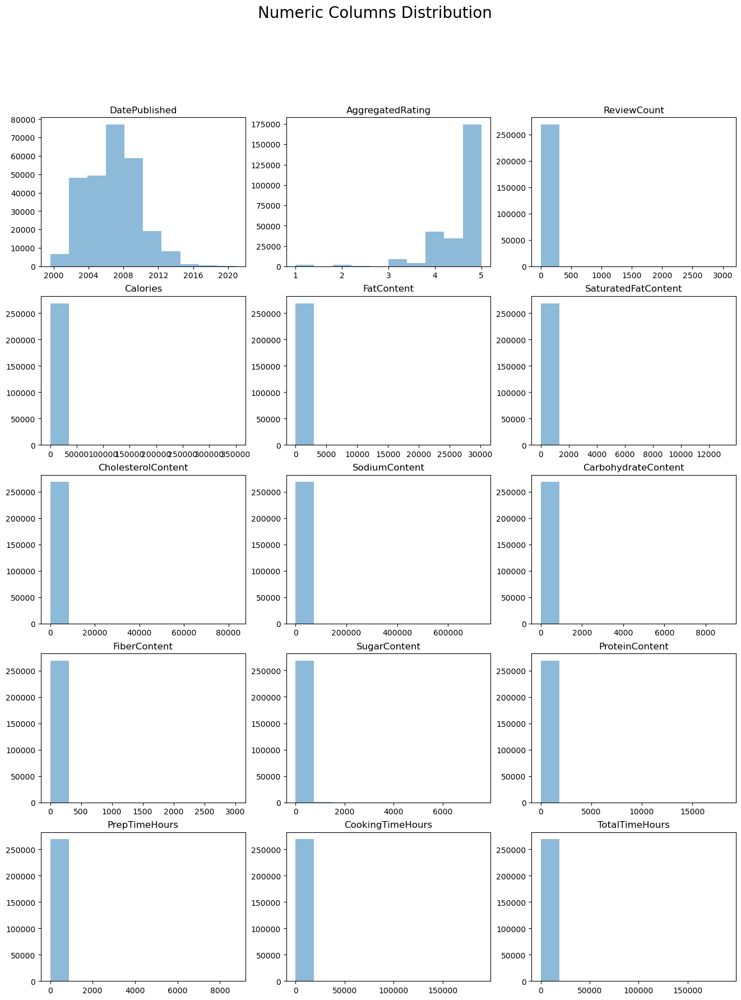

In [46]:
#plot all distribution
fig, ax = plt.subplots(5,3,figsize =(16,20))
fig.suptitle("Numeric Columns Distribution ", fontsize=20)

#select all the numeric columns except Ids
Num_col = df.select_dtypes(exclude = 'object').drop(columns = ['RecipeId','AuthorId']).columns

i=0
for column in Num_col:
    plt.subplot(5,3,i+1)
    plt.hist(df[column],alpha=0.5)
    plt.title(column)
    i+=1
    
plt.show()

As we can see, there are many outliers in our dataset that does not allow us to see the visualizations properly; so lets plot them by Logaritmic y.

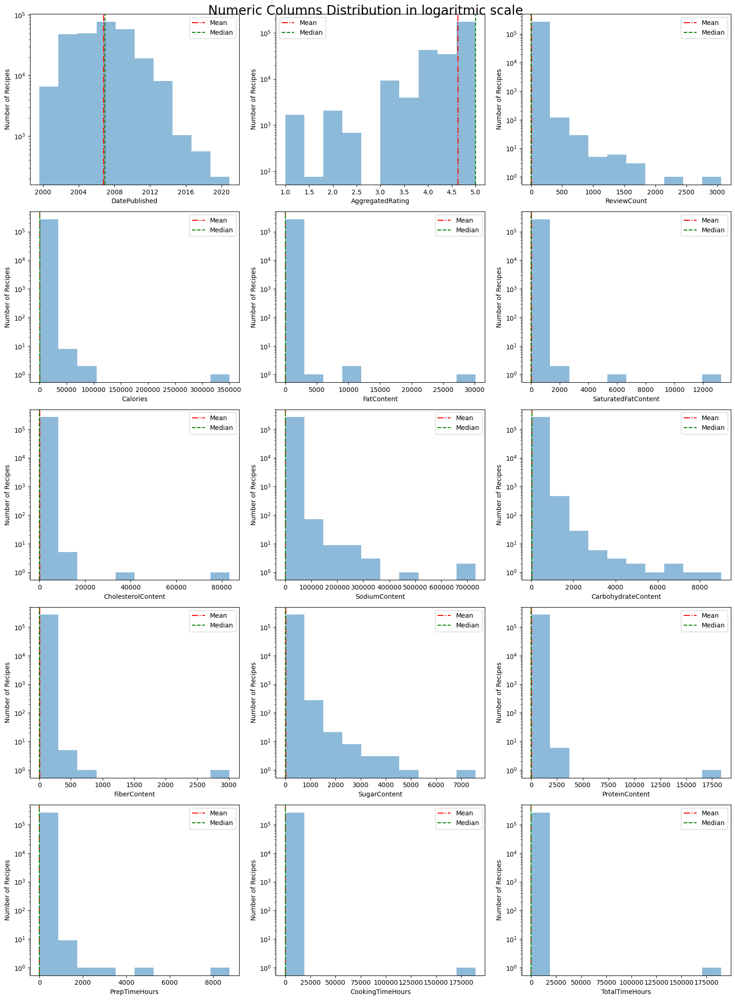

In [47]:
#plot all distribution
fig, ax = plt.subplots(5,3,figsize =(16,22))
fig.suptitle("Numeric Columns Distribution in logaritmic scale ", fontsize=20)

#select all the numeric columns except Ids
Num_col = df.select_dtypes(exclude = 'object').drop(columns = ['RecipeId','AuthorId']).columns

i=0
for column in Num_col:
    plt.subplot(5,3,i+1)
    plt.hist(df[column],alpha=0.5)
    plt.xlabel(column)
    plt.ylabel('Number of Recipes')
    plt.yscale('log')
    plt.axvline(df[column].mean(), c='r', linestyle='-.',label='Mean')
    plt.axvline(df[column].median(), c='g',linestyle='--', label='Median')
    plt.legend()
    i+=1
    
#plt.subplots_adjust(right=0.9,top=0.9)
plt.tight_layout()
plt.show()    

**Note1** As the chart shows our data is not normally distributed during years; if we wanted to run any model base on time, we have to consider this.<br>
**Note2** More over recipe ratings are not normal and most of the recipes have very good ratings.<br>

Most of the other columns seems need more investigation and maybe we have to drop some outliers particularly in the nutrition facts columns. First, we will check them all to make sure if there is typo or any pattern that we can correct the data.
plan for checking:
- Calories and Nutrition facts
- Review Ids
- Times

**Calories and Nutrition facts** <a name='Calories_and_Nutrition_facts'> </a>
<br> First, one of the important columns here is the Calories column. so lets go a little deeper.

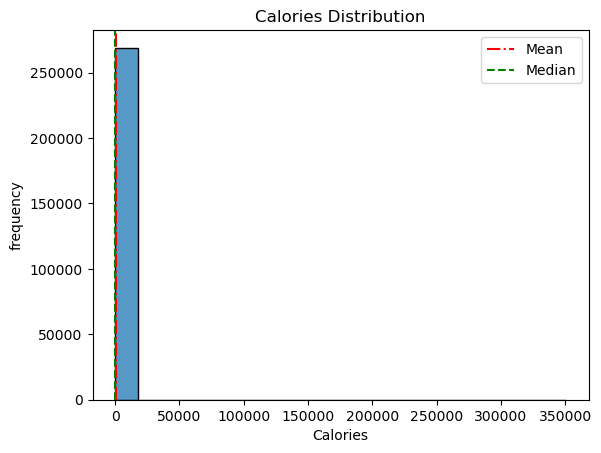

In [48]:
#colories histogram
plt.figure()

sns.histplot(df["Calories"],bins=20)
plt.xlabel("Calories")
plt.ylabel("frequency")
plt.title("Calories Distribution")
plt.axvline(df["Calories"].mean(), c='r', linestyle='-.',label='Mean')
plt.axvline(df["Calories"].median(), c='g',linestyle='--', label='Median')
plt.legend()

plt.show()

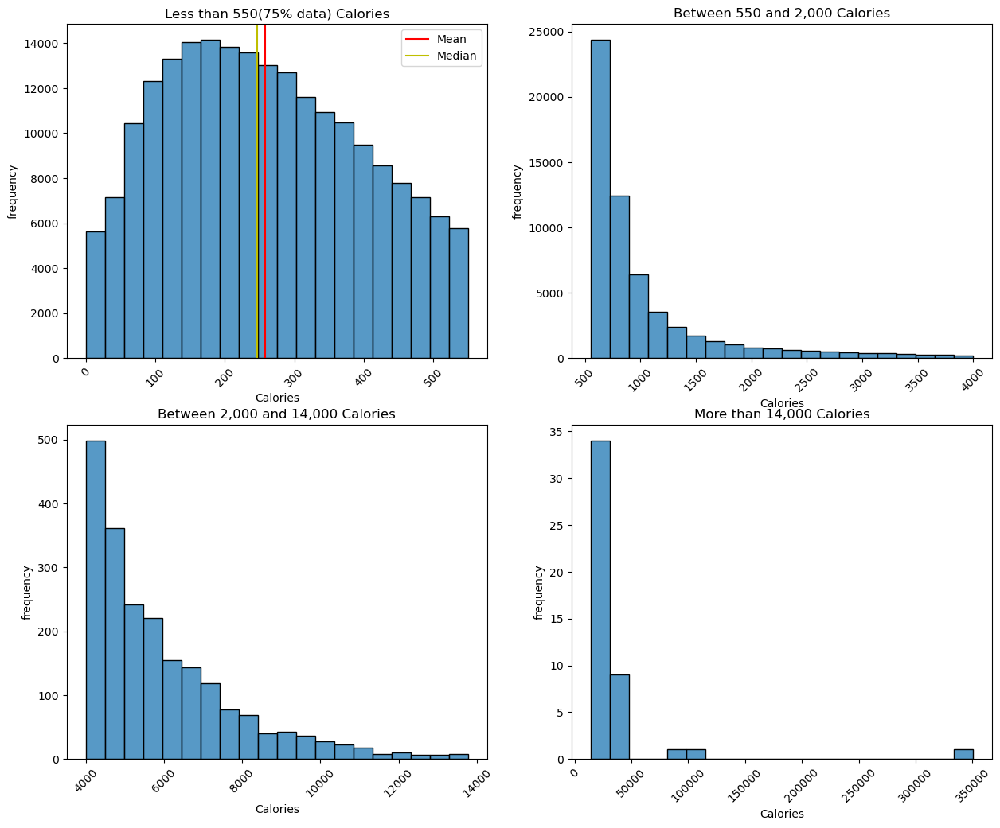

In [49]:
plt.subplots(2,2, figsize=(15,12))

plt.subplot(2,2,1)
XS_cal_df = df[df["Calories"] <= 550]
sns.histplot(XS_cal_df["Calories"],bins=20)
plt.axvline(XS_cal_df["Calories"].mean(), c='r', label='Mean')
plt.axvline(XS_cal_df["Calories"].median(), c='y', label='Median')
plt.legend()
plt.xlabel("Calories")
plt.ylabel("frequency")
plt.xticks(rotation=45)
plt.title("Less than 550(75% data) Calories")


#less than 2000
plt.subplot(2,2,2)
S_cal_df = df[(df["Calories"]>550) & (df["Calories"] <= 4000)]
sns.histplot(S_cal_df["Calories"],bins=20)
plt.xlabel("Calories")
plt.ylabel("frequency")
plt.xticks(rotation=45)
plt.title("Between 550 and 2,000 Calories")

# between 2000 to 20000
plt.subplot(2,2,3)
M_cal_df = df[(df["Calories"]>4000) & (df["Calories"] <= 14000)]
sns.histplot(M_cal_df["Calories"],bins=20)
plt.xlabel("Calories")
plt.ylabel("frequency")
plt.xticks(rotation=45)
plt.title("Between 2,000 and 14,000 Calories")

#more than 20000
plt.subplot(2,2,4)
L_cal_df = df[(df["Calories"]>14000)]
sns.histplot(L_cal_df["Calories"],bins=20)
plt.xlabel("Calories")
plt.ylabel("frequency")
plt.xticks(rotation=45)
plt.title("More than 14,000 Calories")
plt.show()

In [50]:
#number of data points for each part of calories
df.loc[ df["Calories"] <= 550,"CaloriesCategory"] = "lessthan550"
df.loc[ (df["Calories"]>550) & (df["Calories"] <= 4000),"CaloriesCategory"] = "between550-4K"
df.loc[ (df["Calories"]>4000) & (df["Calories"] <= 14000),"CaloriesCategory"] = "between4K-14K"
df.loc[ df["Calories"]>14000,"CaloriesCategory"] = "morethan14K"

df["CaloriesCategory"].value_counts()

lessthan550      208316
between550-4K     58566
between4K-14K      2110
morethan14K          46
Name: CaloriesCategory, dtype: int64

In [51]:
#particularly between 1K to 5K
print("1K-2k:",df[(df["Calories"]>1000) & (df["Calories"] <= 2000)].count()[0])
print("2K-3k:",df[(df["Calories"]>2000) & (df["Calories"] <= 3000)].count()[0])
print("3K-4k:",df[(df["Calories"]>3000) & (df["Calories"] <= 4000)].count()[0])
print("4K-5k:",df[(df["Calories"]>4000) & (df["Calories"] <= 5000)].count()[0])

1K-2k: 12244
2K-3k: 3453
3K-4k: 1683
4K-5k: 868


lets see if has any special categories in very large amounts like more than 3k.

In [52]:
#most extraordinary calories
df[(df["Calories"]>3000)]["RecipeCategory"].value_counts(normalize = True).sort_values(ascending=False).head(10)

Dessert         0.348268
Quick Breads    0.085178
Pie             0.070331
Breads          0.070070
Candy           0.039594
Bar Cookie      0.037249
Yeast Breads    0.031779
Lunch/Snacks    0.027090
Cheesecake      0.024746
Drop Cookies    0.017452
Name: RecipeCategory, dtype: float64

In [53]:
# lets have a look at high calories recipes
df[(df["Calories"]>3000)].sort_values("Calories").head(10)

,RecipeId,Name,AuthorId,AuthorName,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeInstructions,PrepTimeHours,CookingTimeHours,TotalTimeHours,CaloriesCategory
41182,45031,Sally's Meat Marinade,56353,TammieV,2002-10-31 20:06:00+00:00,My best friend gave me this recipe several yea...,[],Meat,"(Weeknight, < 4 Hours, Easy)","(1 1⁄4, 1, 1⁄2, 1⁄3, 1⁄3, 2, 3, 1, 2, 2, 1⁄4)","(soy sauce, wine vinegar, lemon juice, Worcest...",4.0,1.0,3000.6,279.5,35.7,0.0,23990.0,108.2,7.7,70.6,37.3,"(Mix together, marinade meat for at least 1 ho...",1.500000,0.0,1.500000,between550-4K
84362,89517,Savory Pumpkin Quiche,122175,nvermd,2004-04-20 19:59:00+00:00,Make and share this Savory Pumpkin Quiche reci...,[],Savory Pies,"(Cheese, Vegetable, Savory, < 4 Hours)","(2, 1⁄2, 1⁄4, 1⁄4, 1, 2, 1, 2, 1⁄2, 1)","(pumpkin puree, bacon, onion, green pepper, eg...",4.0,1.0,3001.7,217.3,78.4,728.2,4170.2,161.9,6.5,8.5,101.6,"(Combine pumpkin, bacon, onion, green pepper, ...",0.250000,1.0,1.250000,between550-4K
278614,289638,Duck Ravioli,762783,Chef Rangel,2008-03-02 21:13:00+00:00,Make and share this Duck Ravioli recipe from F...,[],Duck,"(Poultry, Meat, European, < 60 Mins)","(2, 1, 4, 1, 3, 6, 1⁄2, 1⁄4, 1⁄2, 1, 12, 3, 12...","(duck breasts, ground pork, swiss chard, ricot...",5.0,1.0,3002.3,125.2,63.6,1117.7,3137.4,307.8,12.5,6.6,101.4,(For the filling: Saute pork with garlic for a...,0.000000,1.0,1.000000,between550-4K
304702,316487,Margie's Cowboy Cookies,107334,pines506,2008-07-29 20:33:00+00:00,Clipped from a newspaper years ago - from Marg...,[],Drop Cookies,"(Dessert, Lunch/Snacks, Cookie & Brownie, Kid ...","(1 1⁄2, 2, 2, 4, 2, 1, 2, 1, 4, 4, 2, 1, 1)","(margarine, brown sugar, white sugar, eggs, pu...",5.0,1.0,3002.3,135.9,43.9,211.5,2464.3,425.1,22.8,256.8,43.8,"(With an electric mixer, whip up the margarine...",0.250000,0.2,0.450000,between550-4K
127170,133626,Rompope - Mexican Eggnog,120566,mariposa13,2005-08-15 21:40:00+00:00,"Rompope is strong, sweet and meant to be sippe...",[],Beverages,"(Mexican, Healthy, Christmas)","(1, 1, 2, 1, 1⁄4, 12, 2)","(sugar, vanilla extract, cinnamon stick, light...",5.0,1.0,3002.5,80.5,35.7,2363.2,483.7,251.7,0.0,253.2,60.5,"(Combine the milk, sugar, vanilla and cinnamon...",0.333333,24.0,24.333333,between550-4K
36543,40275,Marinade for Venison,47510,Dreamgoddess,2002-09-15 17:31:00+00:00,A friend from work gave me this recipe. If you...,[https://img.sndimg.com/food/image/upload/w_55...,Wild Game,"(Meat, < 15 Mins, Easy)","(1, 1, 1, 1, 1, 1)","(sugar, bell pepper, green onion, soy sauce)",5.0,3.0,3002.9,218.9,28.4,0.0,16113.0,246.4,9.7,217.5,34.9,"(Combine all ingredients., Let venison soak in...",0.083333,0.0,0.083333,between550-4K
165459,173203,Apricot Pie,242766,Bayhill,2006-06-17 15:27:00+00:00,Posted for the Zaar World Tour 2006-Canada.\r\...,[],Pie,"(Dessert, Fruit, Canadian, < 4 Hours, Easy)","(1, 1⁄3, 2, 2, 1, 1⁄2, 1)","(walnuts, fresh apricots, granulated sugar)",5.0,1.0,3002.9,164.7,36.9,188.8,2182.7,350.7,29.0,145.3,44.0,"(Preheat oven to 400ºF. In a small bowl, combi...",0.916667,0.5,1.416667,between550-4K
26759,30299,Mom's Zucchini Casserole,14749,Rodger,2002-06-04 23:36:00+00:00,It's a great casserole and freezes well. I usu...,[],One Dish Meal,"(Meat, Weeknight, Oven, Freezer, < 4 Hours, Easy)","(3, 1 1⁄2, 1, 1, 1⁄4, 1, 2 -3, 1, 1⁄4, 1⁄4, 1,...","(zucchini, ground beef, onion, salt, pepper, o...",3.0,1.0,3003.0,201.4,100.4,772.3,6879.8,108.0,10.1,19.6,190.2,(Cook zucchini in salted water until almost te...,0.750000,0.5,1.250000,between550-4K
1227,2664,Twinkie Pie,34879,Barefoot Beachcomber,1999-08-07 16:33:00+00:00,Make and share this Twinkie Pie recipe from Fo...,[],Pie,"(Dessert, < 15 Mins)","(9, 3, 1, 1⁄2, 1⁄2, 6, 1, 1)","(eggs, cream of tartar, sugar, vanilla extract...",5.0,3

Most of high calories are from Dessert category which make sense.
- Based on Food.com website, these calories amount are per servings. this means they have been already normalized based on servings. However, the size of each serving varies from about 200 g to more than 4Kg. this is the reason that we see exceptionaly large calories.

Lets make a dataframe with more logical values for calories. --> there is no calculation behind choosing 3,000 but it comes from domain knowladge.

In [54]:
#Number of data points we loose if we use more than 3K
df.shape[0] - df[(df["Calories"]<3000)].shape[0] 

3839

In [55]:
#Number of data points we loose if we use more than 4K
df.shape[0] - df[(df["Calories"]<4000)].shape[0]

2156

In [56]:
# omiting Calories outliers
df_calLower3K = df[(df["Calories"]<3000)]

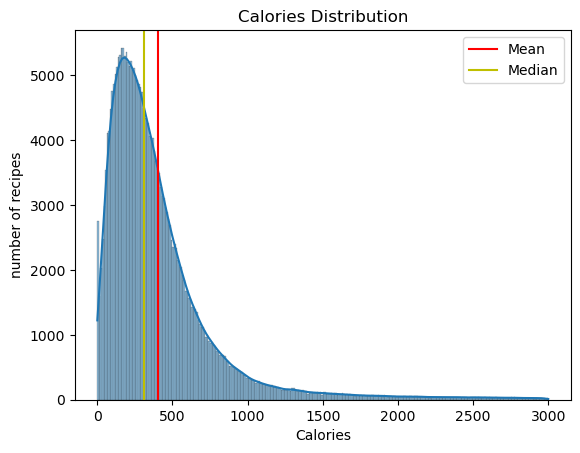

In [57]:
#distribution of less than 3K
plt.figure()
sns.histplot(df_calLower3K["Calories"],kde=True)
plt.axvline(df_calLower3K["Calories"].mean(), c='r', label='Mean')
plt.axvline(df_calLower3K["Calories"].median(), c='y', label='Median')
plt.legend()
plt.xlabel("Calories")
plt.ylabel("number of recipes")
plt.title("Calories Distribution")

plt.show()

Lets see the distribution of other nutrition facts columns for data ofter droping calories outliers.

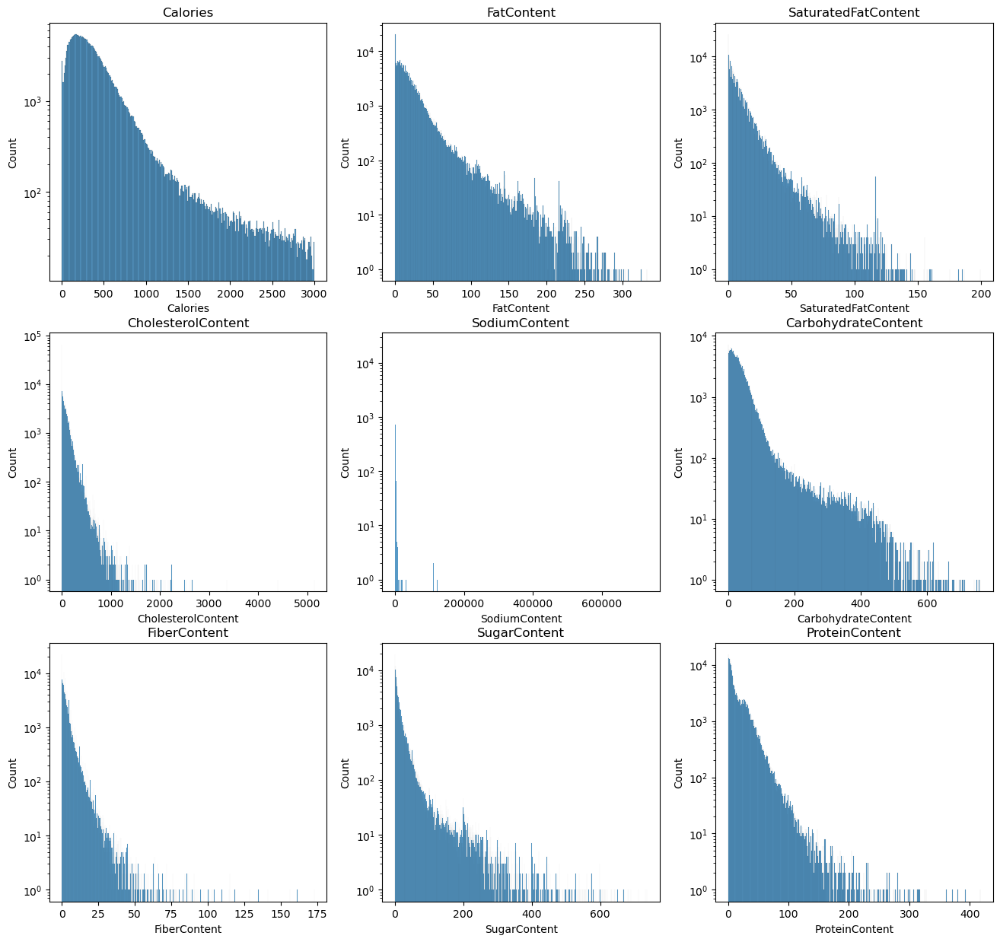

In [58]:
#plot all distribution
plt.subplots(3,3,figsize =(16,15))

#select all the numeric columns except Ids
Num_col = df_calLower3K.select_dtypes(exclude = 'object').drop(columns = ['ReviewCount','AggregatedRating','DatePublished','RecipeId','AuthorId','PrepTimeHours','CookingTimeHours','TotalTimeHours']).columns

i=0
for column in Num_col:
    plt.subplot(3,3,i+1)
    sns.histplot(df_calLower3K[column])
    plt.title(column)
    plt.yscale('log')
    i+=1
    
plt.show()

**Reviewcounts** <a name ='Reviewcounts'></a> <br>
Let's move forward to `Reviewcounts` column. and find the outliers and see if any patterns or behind reason it has.

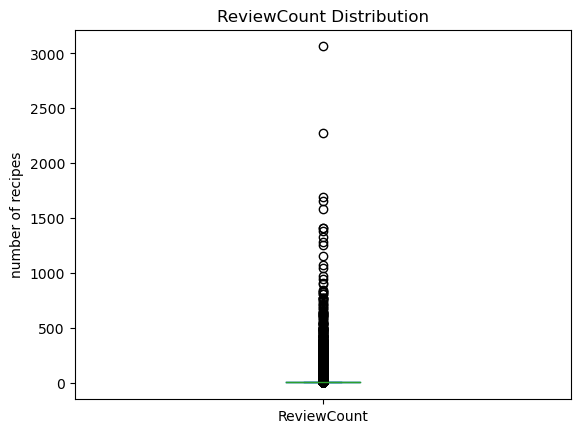

In [59]:
# ReviewCount distribution
plt.figure()
df["ReviewCount"].plot(kind='box')
#plt.xlabel("ReviewCount")
plt.ylabel("number of recipes")
plt.title("ReviewCount Distribution")

plt.show()

In [60]:
#check if the Reviewcount outliers are affected by removing calories outliers.
df["ReviewCount"].describe()
#no change

count    269038.000000
mean          5.318516
std          20.597388
min           1.000000
25%           1.000000
50%           2.000000
75%           4.000000
max        3063.000000
Name: ReviewCount, dtype: float64

In [61]:
df[df["ReviewCount"]>4]["ReviewCount"].describe()

count    66105.000000
mean        16.025641
std         39.644013
min          5.000000
25%          6.000000
50%          8.000000
75%         14.000000
max       3063.000000
Name: ReviewCount, dtype: float64

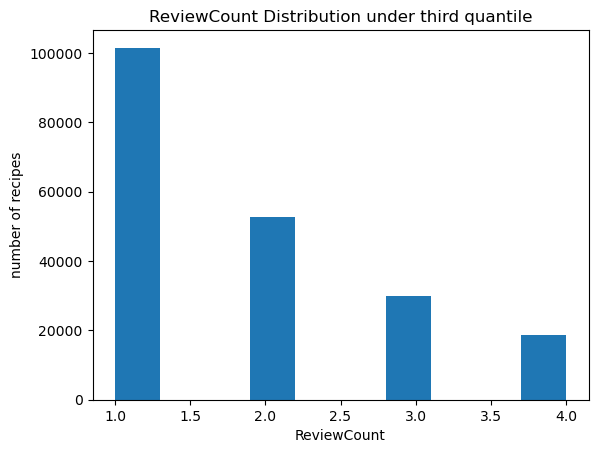

In [62]:
#distribution for under Q3
plt.figure()
df[df["ReviewCount"]<=4.000]["ReviewCount"].plot(kind='hist')
plt.xlabel("ReviewCount")
plt.ylabel("number of recipes")
plt.title("ReviewCount Distribution under third quantile")

plt.show()

50% of our recipe dataset have 1 or 2 reviews.

Maybe the reason for some extraordinary review numbers for recipes is that some bots are generating them, however we can not make sure.<br>
These numbers are the same as the ones showing on the website; so we can use them as the website itself has accepted them and is showing to users.<br>
Lets see if they are from any special category or author.

In [63]:
#number of recipes with unsual reviews
df[df['ReviewCount']>100]['RecipeId'].count()

1093

In [64]:
#number of recipes with unusual number of reviews in categories
df[df["ReviewCount"]>100.000].groupby("RecipeCategory")["ReviewCount"].count().sort_values(ascending=False).head(10)

RecipeCategory
Dessert           107
One Dish Meal      88
Lunch/Snacks       67
Quick Breads       57
Chicken            52
Pork               46
Breakfast          44
Vegetable          41
Yeast Breads       40
Chicken Breast     40
Name: ReviewCount, dtype: int64

Dessert Category is the category with the highest number of recipe with unsual review number. however high number reviw recipes is not concentrated all here.

In [65]:
#number of recipes with unusual number of reviews for each author
df[df["ReviewCount"]>100.000].groupby("AuthorName")["ReviewCount"].count().sort_values(ascending=False)

AuthorName
Kittencalrecipezazz    45
MizzNezz               36
ratherbeswimmin        27
Karen..                22
Marie                  15
                       ..
Karin...                1
Kaccy G.                1
KJK 5                   1
JustJanS                1
zoe85                   1
Name: ReviewCount, Length: 586, dtype: int64

recipes with unusual number of reviews are not consenterated in a few number of authors; they are 586 different authors with recipes by more than 100 review counts. This fact lowers the probability of using bot for generating reviews by authors.

Lets create a dataset witout outliers.

In [66]:

#number of recipes with unsual reviews in df without calories outliers
print(df_calLower3K[df_calLower3K['ReviewCount']>100]['RecipeId'].count())

#new data frame
df_calLower3K_Revless100 = df_calLower3K[df_calLower3K['ReviewCount']<100]

1090


**Times** <a name ='Times'></a>


Now we can check the time distribudtions and check if there is any typo or wrong data inputed.

In [67]:
TimeColumns = ['PrepTimeHours','CookingTimeHours','TotalTimeHours']
df[TimeColumns].describe()

,PrepTimeHours,CookingTimeHours,TotalTimeHours
count,269038.000000,269038.000000,269038.000000
mean,0.703967,2.080382,2.784112
std,23.542165,366.389600,369.090157
min,0.000000,0.000000,0.000000
25%,0.166667,0.166667,0.333333
50%,0.250000,0.333333,0.666667
75%,0.333333,0.750000,1.083333
max,8760.000000,189312.000000,189912.000000


In [68]:
# total time more than 1 month
df[df["TotalTimeHours"]>(24*30)].sort_values("TotalTimeHours",ascending=False).head(10)

,RecipeId,Name,AuthorId,AuthorName,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeInstructions,PrepTimeHours,CookingTimeHours,TotalTimeHours,CaloriesCategory
276283,287220,Barf Dip,757397,AndysGirl,2008-02-20 19:03:00+00:00,"Looks disgusting, tastes amazing! Such a great...",[],Meat,"(For Large Groups, Easy)","(4, 2, 1)","(hamburger, salsa)",3.0,1.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,"(Brown and drain hamburger., Mix all ingredien...",600.000000,189312.0,189912.000000,lessthan550
431961,447963,How to Preserve a Husband,576273,Chef GreanEyes,2011-02-01 19:46:00+00:00,found this in a local wyoming cookbook &quot;a...,[],Low Protein,"(Easy,)","(1⁄2, 1)",(),5.0,2.0,407.4,37.3,23.1,132.7,40.6,17.9,2.2,12.7,4.0,(be careful in your selection. don't choose to...,8760.000000,8760.0,17520.000000,lessthan550
280497,291571,Homemade Fruit Liquers,553251,Chef Penn State,2008-03-12 23:23:00+00:00,This should be a nice easy project for those w...,[],Beverages,"(Dessert, Berries, Fruit, Easy)","(1, 3, 1 1⁄4)","(berries, vodka, granulated sugar)",4.0,1.0,836.2,0.0,0.0,0.0,2.2,83.3,0.0,83.3,0.0,"(Rinse the fruit or berries, Fruit must be cut...",4800.000000,0.0,4800.000000,between550-4K
207257,216215,Celtic Druid's Honey Mead - Meade - Metheglin,242729,French Tart,2007-03-11 16:08:00+00:00,"Mead, made from fermented honey, was the earli...",[https://img.sndimg.com/food/image/upload/w_55...,Beverages,"(Lemon, Citrus, Fruit, Welsh, European, Egg Fr...","(2, 2, 6, 1, 8, 3, 1)","(gingerroot, lemons, juice and rind of, whole ...",5.0,3.0,531.0,0.4,0.1,0.0,25.9,143.3,1.1,140.3,0.8,"(EQUIPEMENT:, Very large Pan - to hold 12 pint...",1.000000,4320.0,4321.000000,lessthan550
410665,425681,Homemade Vanilla,28177,Tinkerbell,2010-05-16 19:27:00+00:00,Found this recipe on Tammy's Blog (http://www....,[https://img.sndimg.com/food/image/upload/w_55...,Easy,"(None,)","(2, 12)","(vanilla beans, vodka)",5.0,1.0,69.4,0.0,0.0,0.0,0.3,0.0,0.0,0.0,0.0,(Slice the vanilla beans length-wise and scrap...,0.083333,4320.0,4320.083333,lessthan550
93537,98912,Peach Brandy,34146,Dee514,2004-09-01 19:59:00+00:00,Posted in reply to a message board request for...,[https://img.sndimg.com/food/image/upload/v1/i...,Beverages,"(Fruit, Low Protein, Low Cholesterol, Healthy,...","(5, 1 1⁄2, 1⁄2, 1)","(granulated sugar, honey, vodka, brandy)",5.0,2.0,3645.3,2.1,0.2,0.0,13.9,520.7,13.1,510.2,8.2,"(Use only fully ripened, unblemished fruit., W...",0.250000,3600.0,3600.250000,between550-4K
93314,98686,Cherry Brandy,34146,Dee514,2004-08-27 19:59:00+00:00,Posted in reply to a message board request for...,[],Beverages,"(Cherries, Fruit, Low Protein, Low Cholesterol...","(4, 1 1⁄2, 1)","(fresh cherries, granulated sugar, vodka, brandy)",5.0,1.0,3164.0,1.2,0.2,0.0,7.1,392.8,12.2,374.1,6.2,"(Use only fully ripened, unblemished fruit., W...",0.250000,3600.0,3600.250000,between550-4K
66004,70551,Angelica Liqueur,59064,Missy Wombat,2003-09-04 20:22:00+00:00,Make and share this Angelica Liqueur recipe fr...,[],Beverages,"(European, Vegan, Weeknight, No Cook, Beginner...","(1, 1, 20, 2 -3, 2, 8, 1)","(fennel seed, anise seed, cloves, angelica, ca...",4.0,1.0,891.8,0.6,0.0,0.0,2.1,228.9,1.1,226.6,0.7,"(Crush the fennel, aniseed, coriander seeds an...",0.166667,3360.0,3360.166667,between550-4K
9767,12931,Rumtopf,5060,Derf2440,2001-10-20 20:11:00+00:00,Rumtopf is a traditional German delicious frui...,[],Lunch/Snacks,"(Fruit, Canadian, German, European, Summer, Wi...","(12, 3, 4 1⁄2, 5, 4 1⁄2, 3 1⁄2, 3, 15)","(sugar, water, golden rum, light rum, green se...",5.0,1.0,11510.6,6.5,1.2,0.0,69.8,1739.4,57.0,1635.8,25.6,"(In a 8 quart stockpot, combine sugar and wate...",3120.000000,0.0,3120.000000,between4K-14K
164408,172114,Raspberry Liqueur,83093,SusieQusie,2006-06-09 18:25:00+00:

In [69]:
#are they for especial category
df[df["TotalTimeHours"]>(24*7)].groupby("RecipeCategory")['RecipeId'].count().sort_values(ascending=False)

RecipeCategory
Beverages          73
Vegetable          25
Lunch/Snacks       17
Dessert            13
Salad Dressings    10
                   ..
Moroccan            1
No Cook             1
Corn                1
Christmas           1
African             1
Name: RecipeId, Length: 68, dtype: int64

Most of the time consuming recipes coming from Beverages that make sense. So they are not typo and we have to keep them.<br>
Lets make a dataset without outliers.

<AxesSubplot: ylabel='Frequency'>

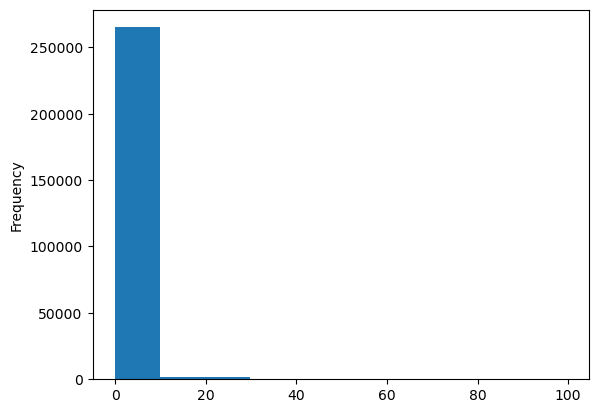

In [70]:
#visual dist for different thresholds to find where are the most of our data
df[df["TotalTimeHours"]<100]["TotalTimeHours"].plot(kind='hist')

Lets have 3days as our threshold of cutting dataset.

In [71]:
#number of outliers with 3days threshold
print('number of outliers with 3days threshold: ',df[df["TotalTimeHours"]>72]['RecipeId'].count())

#number of outliers with 3days threshold in cleaned dataset
print('number of outliers with 3days threshold in cleaned dataset: ',df_calLower3K_Revless100[df_calLower3K_Revless100["TotalTimeHours"]>72]['RecipeId'].count())

number of outliers with 3days threshold:  525
number of outliers with 3days threshold in cleaned dataset:  486


In [72]:
df_calLower3K_Revless100_totTime3d = df_calLower3K_Revless100[df_calLower3K_Revless100["TotalTimeHours"]<72]

### Categorical Columns <a name='Categorical_Columns'></a>


Among all the categorical columns such as Description etc. the AuthorName, RecipeCategory and RecipeName are the ones that their distribution can be investiged more.<br>
Lets first check the **Authors**.<a name= authors></a>

In [73]:
#total number of authors
len(df["AuthorId"].unique())

#total number of authors
#len(df["AuthorName"].unique())
#Note that AuthorName is not unique

30950

Because we have 30892 different authors, we are not able to make a bar plot so we will use the hist of that.

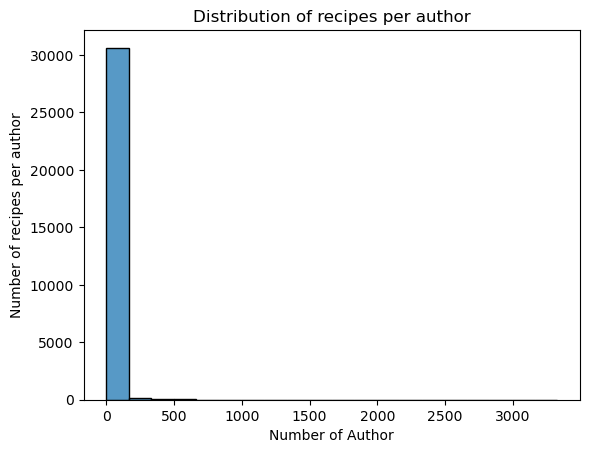

In [74]:
#distribution of recipes per person
plt.figure()
sns.histplot(df["AuthorName"].value_counts().values,bins=20)
plt.title("Distribution of recipes per author")
plt.xlabel("Number of Author")
plt.ylabel("Number of recipes per author")

plt.show()

Here we also see many outliers. this means we have a few authors that has extra large number of recipes. for having a better sense of data lets use logaritmic scale.

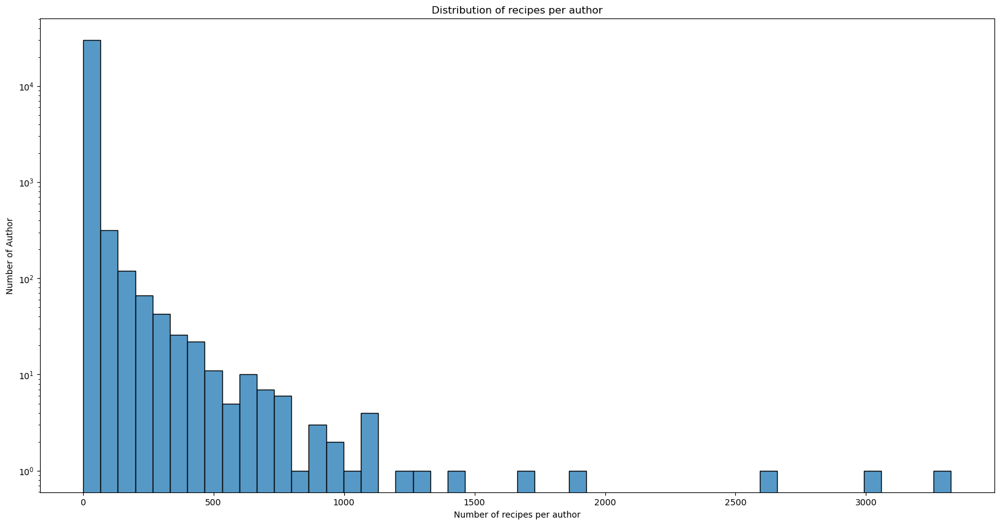

In [75]:
#distribution of recipes per person
plt.figure(figsize = (20,10))
sns.histplot(df["AuthorName"].value_counts().values,bins=50)
plt.title("Distribution of recipes per author")
plt.xlabel("Number of recipes per author")
plt.ylabel("Number of Author")
plt.yscale('log')

plt.show()

In [76]:
#dataframe of recipe per author
RecipePerAthor = pd.DataFrame({"author":df["AuthorName"].value_counts().index,"RecPerAuthor":df["AuthorName"].value_counts().values})



In [77]:
# check the distribution numerically
RecipePerAthor["RecPerAuthor"].describe()

count    30892.000000
mean         8.708986
std         52.633808
min          1.000000
25%          1.000000
50%          1.000000
75%          4.000000
max       3325.000000
Name: RecPerAuthor, dtype: float64

In [78]:
#number of authors have more than 40 recipes
RecipePerAthor[RecipePerAthor["RecPerAuthor"]>40]["RecPerAuthor"].count()

1032

Just about 1K of authors out of 30k authors has more than 40 recipes. 50% of authors have only 1 recipe and 75% of authors has up to 4.

In [79]:
#top author
RecipePerAthor[RecipePerAthor["RecPerAuthor"] == np.max(RecipePerAthor["RecPerAuthor"])]

,author,RecPerAuthor
0,Kittencalrecipezazz,3325


In [80]:
#10 top authors
df["AuthorName"].value_counts().sort_values(ascending=False).head(10)

Kittencalrecipezazz    3325
ratherbeswimmin        3044
Sharon123              2630
Dancer                 1873
Rita1652               1697
Annacia                1410
evelynathens           1289
Bergy                  1219
MizzNezz               1130
PalatablePastime       1127
Name: AuthorName, dtype: int64

Top author in terms of number of recipes is Kittencalrecipezazz with 3325 recipes.

**Recipe Category** <a name='Recipe_Category'></a>




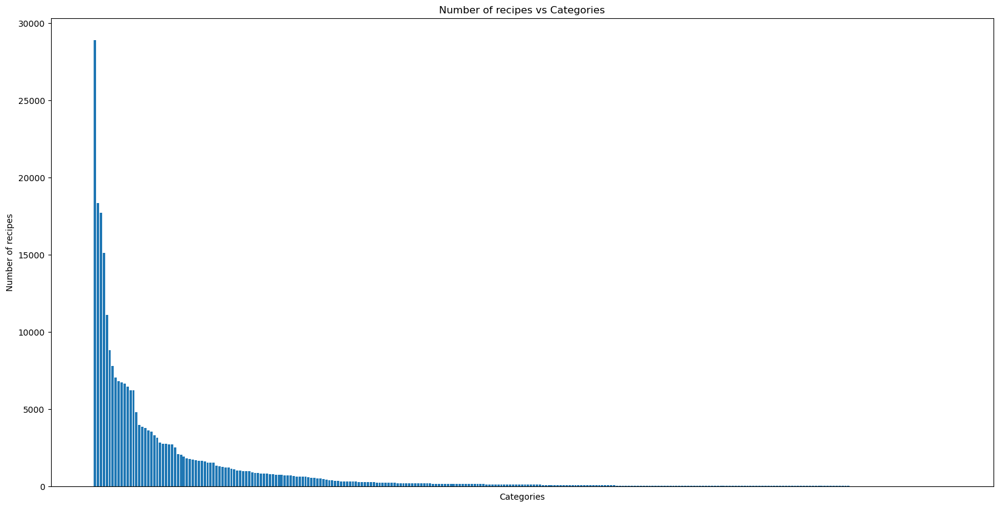

In [81]:
# number of recipes per categories
plt.figure(figsize=(20,10))
plt.bar(df["RecipeCategory"].value_counts(normalize=True).index,df["RecipeCategory"].value_counts().values)
plt.xticks(ticks=[])
plt.ylabel("Number of recipes")
plt.xlabel("Categories")
plt.title("Number of recipes vs Categories")
plt.show()

Also lets see this in terms of distribution.

to better visuals lets use logaritmic scale.

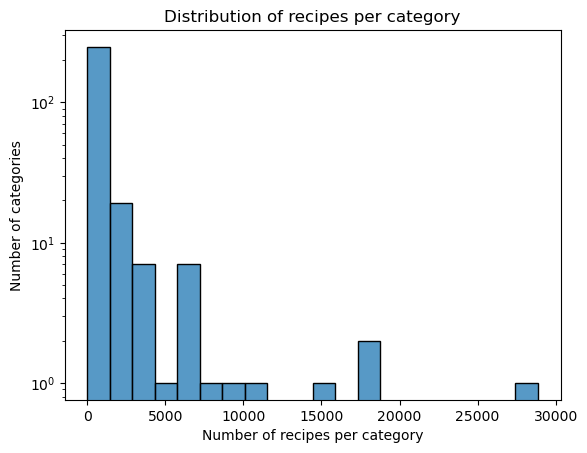

In [82]:
plt.figure()
sns.histplot(df["RecipeCategory"].value_counts().values,bins=20)
plt.title("Distribution of recipes per category")
plt.xlabel("Number of recipes per category")
plt.ylabel("Number of categories")
plt.yscale('log')
plt.show()

In [83]:
#how recipes distributed in categories
df["RecipeCategory"].describe()

count      269038
unique        289
top       Dessert
freq        28869
Name: RecipeCategory, dtype: object

In [84]:
# top categories with most recepies.
df["RecipeCategory"].value_counts().sort_values(ascending=False).head(10)

Dessert          28869
Lunch/Snacks     18348
One Dish Meal    17683
Vegetable        15081
Breakfast        11097
Beverages         8795
Chicken           7775
Pork              7023
Breads            6794
Meat              6729
Name: RecipeCategory, dtype: int64

Maybe we can group categories together to have less number of categories.`

In [85]:
df["RecipeCategory"].value_counts(normalize=True).head(20)*100

Dessert           10.730454
Lunch/Snacks       6.819854
One Dish Meal      6.572677
Vegetable          5.605528
Breakfast          4.124696
Beverages          3.269055
Chicken            2.889926
Pork               2.610412
Breads             2.525294
Meat               2.501134
Chicken Breast     2.469540
Potato             2.388138
Sauces             2.312684
Quick Breads       2.301534
Cheese             1.786365
Bar Cookie         1.477858
Pie                1.425077
< 60 Mins          1.403519
Drop Cookies       1.341818
< 30 Mins          1.315799
Name: RecipeCategory, dtype: float64

The REcipecategory is has many values and the data is very distributed in the categories. we can group them, or we can just just not use this column for now,because we have almost the same information at the Keywords column.

**Rating** <a name = 'Rating' a>

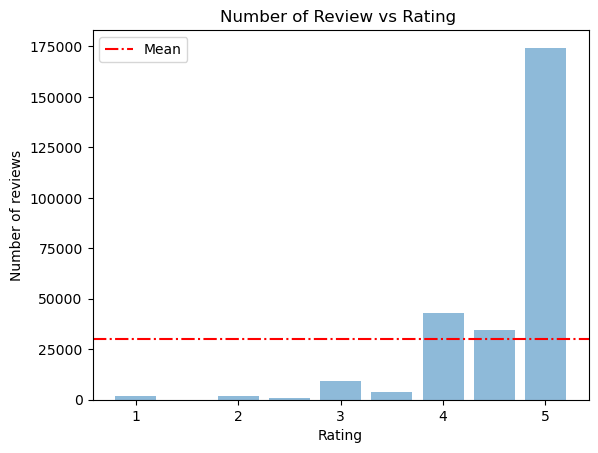

In [86]:
plt.figure()
plt.bar(df["AggregatedRating"].value_counts().index, df["AggregatedRating"].value_counts().values, alpha=0.5, width= 0.4)
plt.ylabel('Number of reviews')
plt.xlabel('Rating')
plt.title('Number of Review vs Rating ')
plt.axhline(df["AggregatedRating"].value_counts().values.mean(), c='r', linestyle='-.',label='Mean')
plt.legend()
plt.show()

Rating is our target variable and its data is not normaly distributed at all.

## Relationships Visualizations <a name ='Relationships_Visualizations' a>

The target value for models would be rating. so lets check the relation of other columns with that.

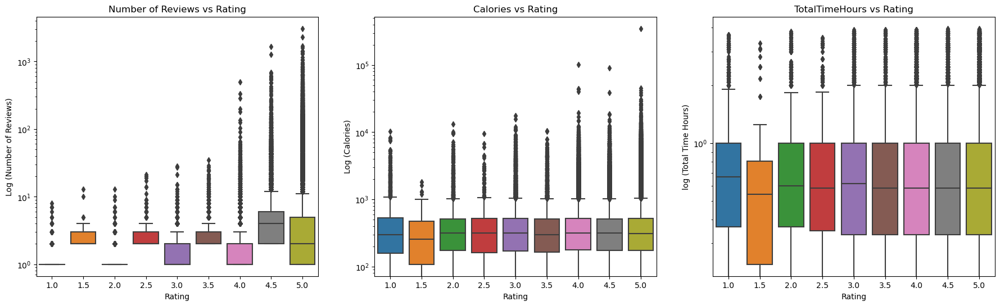

In [87]:
plt.subplots(1,3,figsize=(22,6))

plt.subplot(1,3,1)
sns.boxplot(x='AggregatedRating',y='ReviewCount',data=df)
plt.xlabel("Rating")
plt.ylabel("Log (Number of Reviews)")
plt.title("Number of Reviews vs Rating")
plt.yscale('log')


plt.subplot(1,3,2)
sns.boxplot(x='AggregatedRating',y='Calories',data=df)
plt.xlabel("Rating")
plt.ylabel("Log (Calories)")
plt.title("Calories vs Rating")
plt.yscale('log')

plt.subplot(1,3,3)
sns.boxplot(x='AggregatedRating',y='TotalTimeHours',data=df[df['TotalTimeHours']<4])
plt.xlabel("Rating")
plt.ylabel("log (Total Time Hours)")
plt.title("TotalTimeHours vs Rating")
plt.yscale('log')

plt.show()



As the chart above suggests, the hours a recipe takes and the calories seem to does not affect the ratings, while the higher ratings tends to have higher number of reviews and even the outlier review numbers tent to belong to the higher rated recipes.

/var/folders/bg/nwrfqr3x53x6dwwjtgkf3bl80000gn/T/ipykernel_7386/2151983794.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  matrix = np.triu(df.corr())
/var/folders/bg/nwrfqr3x53x6dwwjtgkf3bl80000gn/T/ipykernel_7386/2151983794.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, center=0, vmin=-1, vmax=1, cmap='coolwarm',mask=matrix)


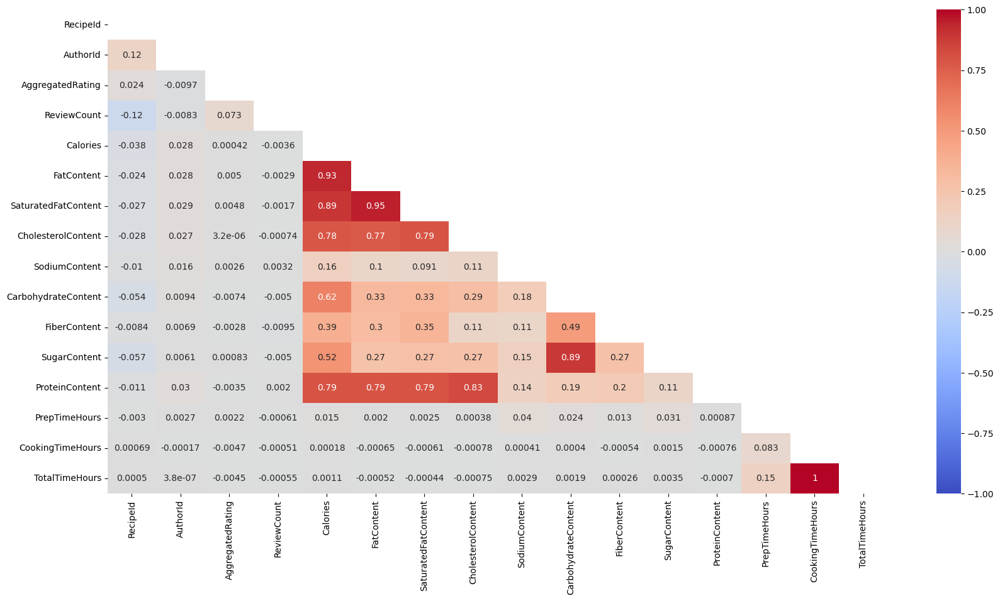

In [88]:
# Plot the correlation matrix as a heatmap
plt.figure(figsize=(20,10))
matrix = np.triu(df.corr())
sns.heatmap(df.corr(), annot=True, center=0, vmin=-1, vmax=1, cmap='coolwarm',mask=matrix)
plt.show()

As we could guess the nutrition factors are highly correlated to each other and total time is correlated to the cooking time and prepration time which also could be expected.

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

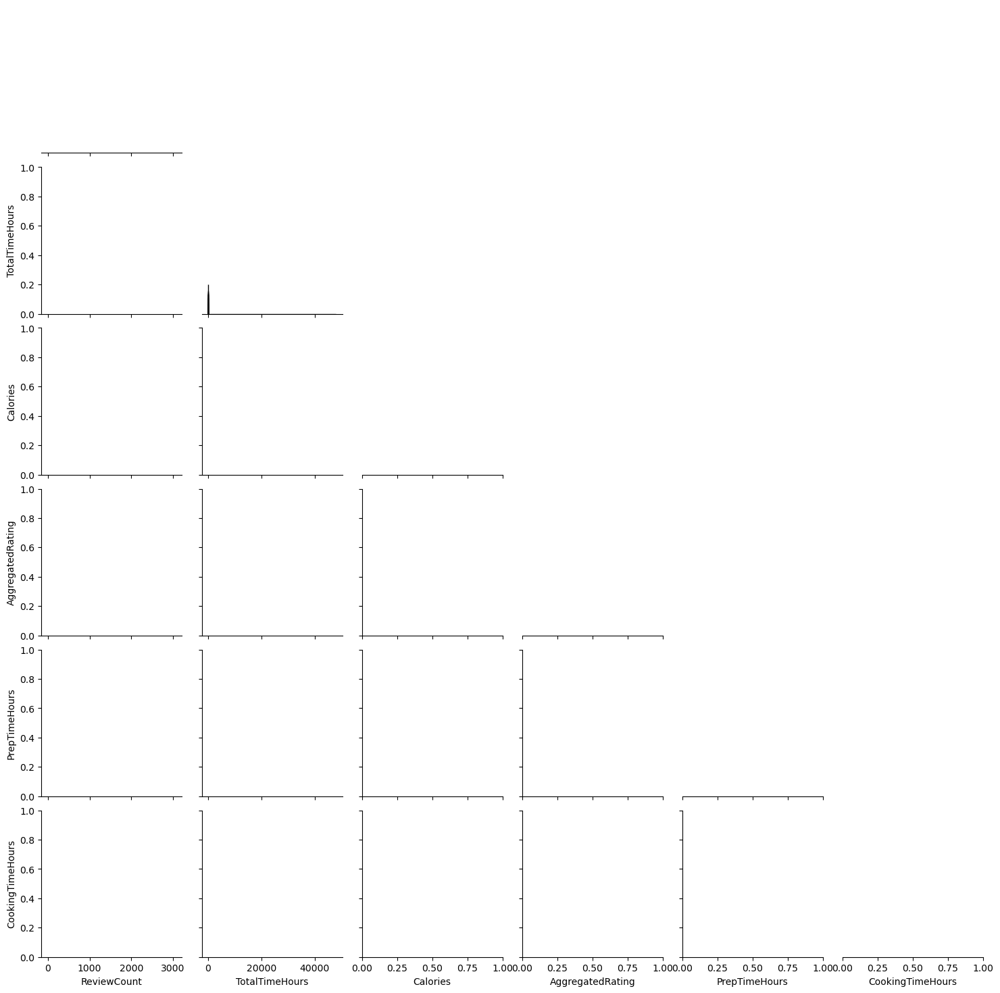

In [99]:
#plt.figure()
#sns.pairplot(data=df[['ReviewCount','TotalTimeHours','Calories','AggregatedRating','PrepTimeHours','CookingTimeHours']], corner=True)
#plt.yscale('log')


#plt.show()

In [90]:
df['rateTwoScale'] = np.where(df["AggregatedRating"]>=4,1,0)
fig = px.scatter(df, x='Calories', y='ReviewCount', log_x=True,log_y=True, size='rateTwoScale',color='rateTwoScale',title = 'Relationship between number of Reviews, Calories and Rating')
fig.update_traces(marker=dict(size=10,
                              line=dict(width=1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

As the above chart shows, there is not a significant relationship between rating and calories. However, most of the low-reted recipes seems to have fewer number of reviews, the dark points in the bottom of the chart.

---
## Slice and Save data

We are going to save the file into a csv file. in this way the keywords are still filled(not going to be missed, and also the text columns will be transformed to string instead of tuples which is desired for us.

In [91]:
df.to_parquet('Transformed Data/cleanedRecipedf.parquet', index=False)

Slice the data set to the managable amount of data to be able to work with in a recommendation system. Instead of choosing randomly, we can filter to have the reipes with high number of reviews. Filtering for more than 20 reviews will result in about 10K rows.

In [92]:
#check the number of rows
df[df['ReviewCount']>20].shape

(9900, 28)

In [93]:
#check the distribution
df[df['ReviewCount']>20]['ReviewCount'].describe()

count    9900.000000
mean       58.056667
std        91.292556
min        21.000000
25%        25.000000
50%        34.000000
75%        56.000000
max      3063.000000
Name: ReviewCount, dtype: float64

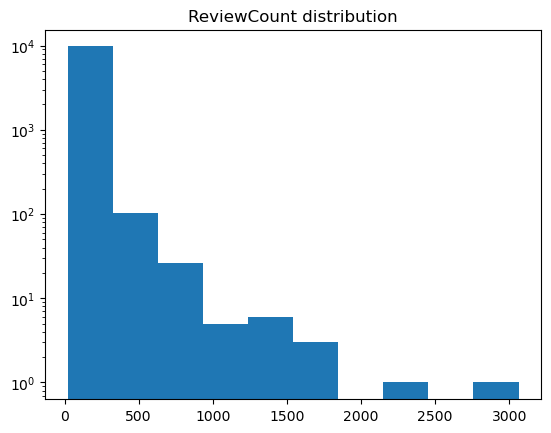

In [94]:
# check if by this sampling the distribution would not be influenced
plt.hist(df[df['ReviewCount']>20]['ReviewCount'])
plt.yscale('log')
plt.title('ReviewCount distribution')
plt.show()

In [95]:
df_HighReviwedRecipes = df[df['ReviewCount']>20]

The other check before saving the sampled data is dropping **the same food names.**
As there is just 150 duplicate food names we can drop them. They are the same food just with different instructions and we are keeping the ones with the higher number of reviews.

In [96]:
#keep the recipe with the highest number of review and drop all the other same names.
df_HighReviwedRecipes = df_HighReviwedRecipes.sort_values('ReviewCount',ascending=False)
df_HighReviwedRecipes = df_HighReviwedRecipes.drop_duplicates(subset='Name',keep='first')

In [97]:
#sanity check 
df_HighReviwedRecipes[df_HighReviwedRecipes['Name'].duplicated()]

,RecipeId,Name,AuthorId,AuthorName,DatePublished,Description,Images,RecipeCategory,Keywords,RecipeIngredientQuantities,RecipeIngredientParts,AggregatedRating,ReviewCount,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeInstructions,PrepTimeHours,CookingTimeHours,TotalTimeHours,CaloriesCategory,rateTwoScale


In [98]:

df_HighReviwedRecipes.to_parquet('Transformed Data/ Cleaned-Sampled-Recipes.parquet', index=False)